# The Vicsek Model 


In [175]:
import numpy as np 
import random 
from numpy import linalg as lag
from math import *
import matplotlib.pyplot as plt
import matplotlib
import matplotlib.animation as animation 
from IPython.display import HTML
plt.style.use('ggplot')


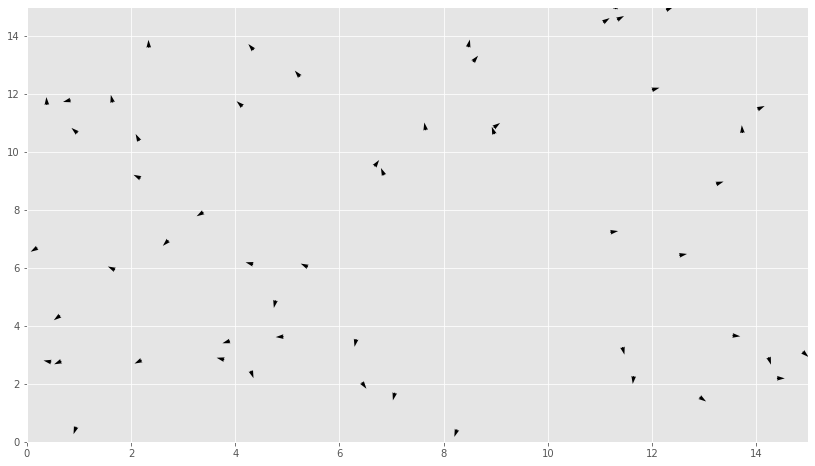

<Figure size 432x288 with 0 Axes>

In [195]:

##USEFUL FUNCTIONS
normal = lambda p: np.array([np.cos(p),np.sin(p)])
normalise = lambda p: p/(np.sqrt(p[0]**2+p[1]**2))
def angle(p):
    principle_angle = np.arctan(p[1]/p[0])
    if p[1]>=0:
        return principle_angle%pi
    else:
        return principle_angle%pi + pi

    
#     def get_thetas_in_rad(self,flock,R):
#         """Returns the angle of movement for each bird less than R away """
#         pd = flock.get_posdir()                       #3*N array of positions and directions [[p1,p2,dir]]
#         b_pos_arr = np.tile(b.pos,(len(pd[:,0]),1))    #tiles together N of the birds position to make calculation easier
#         difference_vectors = pd[:,0:2]- b_pos_arr  
#         indexs = np.sqrt(np.sum(difference_vectors**2,axis=1))<R
#         rad_thetas = pd[indexs][:,2] 
#         return rad_thetas

    
            

class Flock():
    def __init__(self,N,speed,frame_size):
        """Frame size should be given in number of radiuses """
        self.frame_size =frame_size
        self.N =N
        self.positions = np.random.uniform(0,frame_size,(self.N,2))
        self.thetas = np.random.uniform(0,2*np.pi,self.N)
        self.speed = speed

    def get_birds_in_radius(self):
        """Returns NxN BOOL array of which birds are in radius (ie the Nth row 
        is an array of which birds are in the Nth birds radius) """
        ##TODO find out whether own birds direction should be included
        return np.identity(self.N,dtype=bool)


    def get_directions(self):
        """Returns array of [[cos(theta),sin(theta)],...] for each theta ie the 
        directions of all the birds"""
        return normal(self.thetas).transpose()


    def update_posdirs(self,dt,sigma,R):
        """Calculates and updates new positions and directions for all the birds """
        new_positions = self.positions + self.get_directions()*self.speed*dt

        tiled_directions = np.tile(self.get_directions(),(self.N,1,1)) ## sort out tiling
        indexs= self.get_birds_in_radius()
        tiled_directions[np.invert(indexs)] *= 0  #removes all birds not in radius from the sum
        direction_sums = np.sum(tiled_directions.reshape(self.N,self.N,2),axis=1)
        new_thetas = np.arctan2(direction_sums[:,1],direction_sums[:,0])   ##check whether storing more variables in memory reduces                                                                               perfomance      
        self.positions = new_positions
        self.thetas = new_thetas

    def display_state(self,plot_type = "q"):
        """Displays current postions of birds on scatter plot """
        #TODO make quiver plot
        # with plt.style.context("dark_background"):
        fig,ax = plt.subplots()
        fig.set_size_inches(14, 8)
        p=self.positions
        ax.set(xlim=(0,self.frame_size),ylim = (0,self.frame_size))
        if plot_type =="q":
            d=self.get_directions()
            sf =100
            plot = plt.quiver(p[:,0],p[:,1],d[:,0],d[:,1],scale =sf)
        elif plot_type =="s":
            plot= plt.scatter(p[:,0],p[:,1],marker =".",color ="b")
        else:
            print("Invalid Plot Type. {} is not supported, pls use 'q' or 's'".format(plot_type))
        plt.show()
        return plot

    def animate_movement(self,dt,interval,frames,sigma,vicsek=False):
        """Creates a matplotlib animation of the birds moving """
        ##sorting arguments
        R =self.frame_size/10


        ##setting up plot
        fig,ax = plt.subplots()
        # fig.set_size_inches(18.5, 10.5)
        ax.set(xlim=(0,self.frame_size),ylim=(0,self.frame_size))
        init_pos = self.positions
        scat =ax.scatter(init_pos[0],init_pos[1],marker=".",c="b")

        #used in funcanimation to update states
        def animate(i):
            if vicsek:
                self.update_posdirs(dt,R,sigma)
            else:
                self.update_pos(dt)
            pos = self.positions
            scat.set_offsets(pos)
        anim  = animation.FuncAnimation(
            fig,animate,interval = interval,frames =frames
        )
        return anim
    def get_movement_arrays(self,dt,interval,fames):
        #TODO 
        pass
    

    def calculate_order_stat(self):
        pass
    
    def plot_order_stat(self):
        pass
        

f = Flock(200,10,15)
f.update_posdirs(1,0.1,1)
plot = f.display_state("q")
plt.savefig("test_save")


In [177]:
##TEST ZONE

# x= np.tile([1,2,3],(3,1))
# print(x)
# y = np.sum(x,axis=1)
# z= normal(y)
# z.transpose()
# def shape(x,name):
#     print(x)
#     print("{} has shape {}".format(name,x.shape))
# x= np.array([[1,2],[3,4],[5,6]])
# shape(x,"x")
# y = np.tile(x,(3,1,1))
# shape(y,"y")

# test_BOOL = np.full((3,3),False)
# z =y[np.invert(test_BOOL)]
# np.sum(z,axis=1)

##np.arctan2 takes y vals, x vals and gives back right quadrant arctan

##QUIVER PLOTS
x=np.arange(-10,10,1)
y=np.arange(-10,10,1)
u,v =np.meshgrid(x,y)




In [4]:
plt.quiver

<function matplotlib.pyplot.quiver(*args, data=None, **kw)>

In [4]:
##this generates a flock of 200 birds with speed 10 for 500 frames
f = Flock (200,0.5,500)
matplotlib.rcParams['animation.embed_limit']=100
anim = f.animate_movement(1,0.5,5000,vicsek=True)
HTML(anim.to_jshtml())


##anim = f.animate_movement(1,10,3000,vicsek=True)




-0.9626147999643426


IndexError: invalid index to scalar variable.

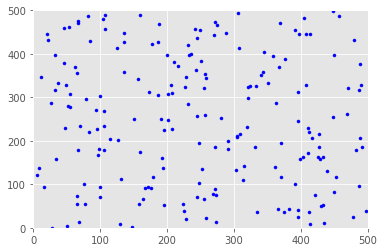

In [41]:
f = Flock (200,10,500)
matplotlib.rcParams['animation.embed_limit']=100
anim = f.animate_movement(0.5,10,1000,vicsek=True)
HTML(anim.to_jshtml())

In [40]:
# HTML(anim.to_jshtml())
r"C://Users//bennm//Documents//UNI//Year 2//Mathematical Programming//Project//anim_123.mp4"
##saving file to dir 
f = r"C://Users//bennm//Documents//UNI//Year 2//Mathematical Programming//Project//vicsek-model-group3//vicsek_flocking_1.mp4"
writervideo = animation.FFMpegWriter(fps=60) 
anim.save(f, writer=writervideo)


AttributeError: 'str' object has no attribute 'get_positions'

In [7]:
    def animate_movement(self,dt,interval,frames):
        """Creates a matplotlib animation of the birds moving """
        ##setting up plot
        fig,ax = plt.subplots()
        fig.set_size_inches(18.5, 10.5)
        ax.set(xlim=(0,self.frame_size),ylim=(0,self.frame_size))
        init_pos = self.positions
        scat =ax.scatter(init_pos[0],init_pos[1],marker=".",c="b")

        #used in funcanimation to update states
        def animate(i):
            self.update_positions(dt)
            pos = self.positions
            scat.set_offsets(pos)
        anim  = animation.FuncAnimation(
            fig,animate,interval = interval,frames =frames
        )
        return anim